In [ ]:
#!pip3 install pandas_profiling --upgrade

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
import pandas_profiling as pp
# models
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
import sklearn.model_selection
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [ ]:
train0 = pd.read_csv('/content/drive/My Drive/Mini project/python mini project/vehicles.csv')
train0.head(5)

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,image_url,description,county,state,lat,long
0,7184791621,https://duluth.craigslist.org/ctd/d/duluth-200...,duluth / superior,https://duluth.craigslist.org,6995,2000.0,gmc,new sierra 1500,excellent,8 cylinders,gas,167783.0,clean,automatic,1GTEK19T3YE366021,4wd,NaN,NaN,red,https://images.craigslist.org/00n0n_f06ykBMcdh...,2000 *** GMC New Sierra 1500 Ext Cab 157.5 WB...,NaN,mn,46.8433,-92.2550
1,7184773187,https://duluth.craigslist.org/cto/d/saginaw-20...,duluth / superior,https://duluth.craigslist.org,8750,2013.0,hyundai,sonata,excellent,4 cylinders,gas,90821.0,clean,automatic,NaN,fwd,NaN,NaN,grey,https://images.craigslist.org/00d0d_kgZ6xoeRw2...,For Sale: 2013 Hyundai Sonata GLS - $8750. O...,NaN,mn,46.9074,-92.4638
2,7193375964,https://newhaven.craigslist.org/cto/d/stratfor...,new haven,https://newhaven.craigslist.org,10900,2013.0,toyota,prius,good,4 cylinders,hybrid,92800.0,clean,automatic,NaN,fwd,NaN,NaN,blue,https://images.craigslist.org/00d0d_3sHGxPbY2O...,2013 Prius V Model Two. One owner—must sell my...,NaN,ct,41.1770,-73.1336
3,7195108810,https://albuquerque.craigslist.org/cto/d/albuq...,albuquerque,https://albuquerque.craigslist.org,12500,2003.0,mitsubishi,lancer,good,4 cylinders,gas,NaN,clean,manual,NaN,4wd,mid-size,sedan,grey,https://images.craigslist.org/00m0m_4a8Pb6JbMG...,"2003 Mitsubishi Lancer Evolution, silver. Abo...",NaN,nm,35.1868,-106.6650
4,7184712241,https://duluth.craigslist.org/ctd/d/rush-city-...,duluth / superior,https://duluth.craigslist.org,16995,2007.0,gmc,sierra classic 2500hd,good,8 cylinders,diesel,254217.0,clean,automatic,1GTHK23D57F102022,4wd,full-size,truck,white,https://images.craigslist.org/01414_g093aPtSMW...,"**Bad Credit, No Credit... No Problem!**2007 G...",NaN,mn,45.6836,-92.9648


In [ ]:
df = train0

Bar plot on Manufacturer vs odometer values

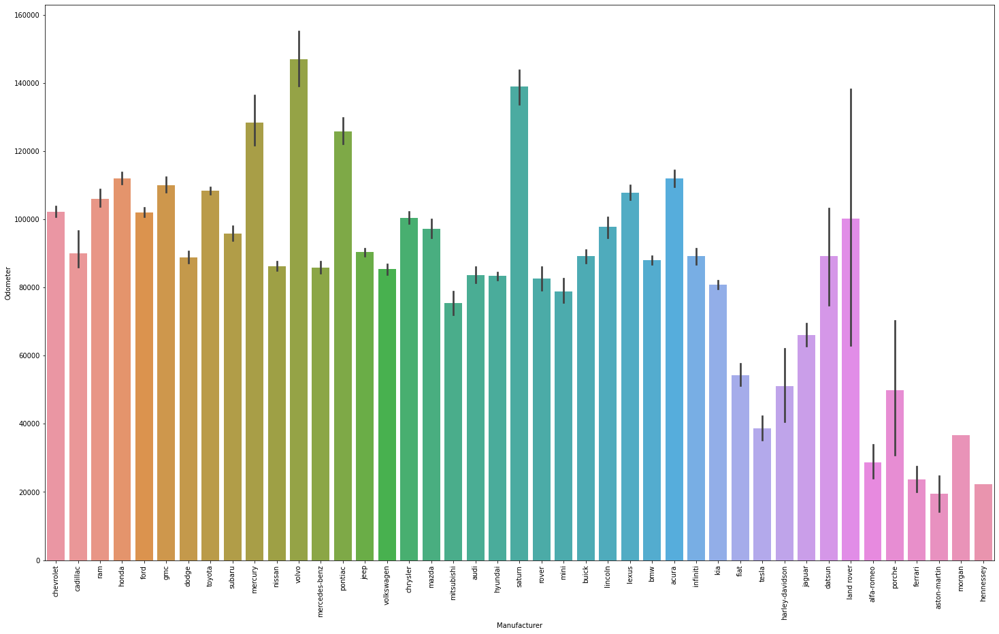

In [ ]:
df=df.sort_values(by=['odometer'],ascending=False)
plt.figure(figsize=(25,15))
sns.barplot(x=df.manufacturer, y=df.odometer)
plt.xticks(rotation= 90)
plt.xlabel('Manufacturer')
plt.ylabel('Odometer')
plt.show()

Plot for paint vs Vehicle type

In [ ]:
import plotly.graph_objects as go
x = df.type
y = df.paint_color

fig = go.Figure(go.Histogram2d(
        x=x,
        y=y
    ))
fig.show()

Plotly - Map Box ( Interactive )

In [ ]:
import plotly.express as px
import folium
from folium.plugins import HeatMap
fig = px.scatter_mapbox(df[df["type"]=="bus"], lat="lat", lon="long", hover_name="paint_color", hover_data=["paint_color", "price"],
                        color_discrete_sequence=["red"], zoom=4, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
train0 = train0.drop(columns =['id','url', 'region', 'region_url', 'model', 'title_status', 'vin', 'size', 'image_url', 'description', 'county','lat','long'])

In [ ]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423857 entries, 0 to 423856
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         423857 non-null  int64  
 1   year          328743 non-null  float64
 2   manufacturer  313242 non-null  object 
 3   condition     176719 non-null  object 
 4   cylinders     197679 non-null  object 
 5   fuel          327214 non-null  object 
 6   odometer      270585 non-null  float64
 7   transmission  328065 non-null  object 
 8   drive         231119 non-null  object 
 9   type          241157 non-null  object 
 10  paint_color   222203 non-null  object 
 11  state         423857 non-null  object 
dtypes: float64(2), int64(1), object(9)
memory usage: 38.8+ MB


In [ ]:
train0 = train0.dropna()
train0.head(5)

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
4,16995,2007.0,gmc,good,8 cylinders,diesel,254217.0,automatic,4wd,truck,white,mn
5,13995,2012.0,ford,good,6 cylinders,gas,188406.0,automatic,4wd,truck,grey,mn
6,7995,2010.0,chevrolet,good,4 cylinders,gas,108124.0,automatic,4wd,SUV,grey,mn
7,8995,2011.0,chevrolet,good,6 cylinders,gas,178054.0,automatic,4wd,SUV,white,mn
8,10995,2014.0,ford,good,6 cylinders,gas,170259.0,automatic,4wd,SUV,white,mn


In [ ]:
#train0.head(1000)
def function_f():
      x = 0
      y=0
      for i in range(20):
        y += x**2
        x += 10
      return y
function_f()

247000

In [ ]:
train0

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
4,16995,2007.0,gmc,good,8 cylinders,diesel,254217.0,automatic,4wd,truck,white,mn
5,13995,2012.0,ford,good,6 cylinders,gas,188406.0,automatic,4wd,truck,grey,mn
6,7995,2010.0,chevrolet,good,4 cylinders,gas,108124.0,automatic,4wd,SUV,grey,mn
7,8995,2011.0,chevrolet,good,6 cylinders,gas,178054.0,automatic,4wd,SUV,white,mn
8,10995,2014.0,ford,good,6 cylinders,gas,170259.0,automatic,4wd,SUV,white,mn
...,...,...,...,...,...,...,...,...,...,...,...,...
423849,9885,2012.0,subaru,excellent,4 cylinders,gas,82000.0,automatic,4wd,hatchback,silver,ct
423850,750,2002.0,saturn,salvage,4 cylinders,gas,40000.0,manual,fwd,coupe,blue,nm
423851,4800,2002.0,ford,good,6 cylinders,gas,58000.0,automatic,rwd,coupe,blue,nm
423852,1600,2006.0,hyundai,fair,6 cylinders,gas,159980.0,automatic,fwd,sedan,blue,mn


In [ ]:
# Determination categorical features
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
categorical_columns = []
features = train0.columns.values.tolist()
for col in features:
    if train0[col].dtype in numerics: continue
    categorical_columns.append(col)
# Encoding categorical features
for col in categorical_columns:
    if col in train0.columns:
        le = LabelEncoder()
        le.fit(list(train0[col].astype(str).values))
        train0[col] = le.transform(list(train0[col].astype(str).values))

In [ ]:
#train0.to_csv("preprocessed_csv.csv")

In [ ]:
#from google.colab import files
#files.download("preprocessed_csv.csv")

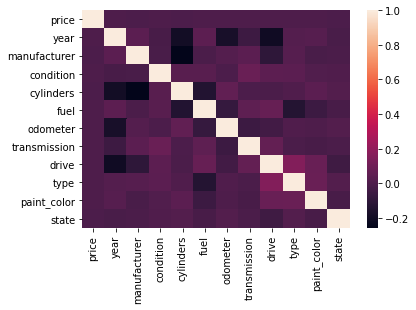

In [ ]:
corr = train0.corr()
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [ ]:
train0['year'] = (train0['year']-1900).astype(int)
train0['odometer'] = train0['odometer'].astype(int)

In [ ]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 85998 entries, 4 to 423853
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   price         85998 non-null  int64
 1   year          85998 non-null  int64
 2   manufacturer  85998 non-null  int64
 3   condition     85998 non-null  int64
 4   cylinders     85998 non-null  int64
 5   fuel          85998 non-null  int64
 6   odometer      85998 non-null  int64
 7   transmission  85998 non-null  int64
 8   drive         85998 non-null  int64
 9   type          85998 non-null  int64
 10  paint_color   85998 non-null  int64
 11  state         85998 non-null  int64
dtypes: int64(12)
memory usage: 8.5 MB


In [ ]:
train0['price'].value_counts()

0         3477
3500      1004
6995       950
4500       933
7995       925
          ... 
2785         1
4770         1
129695       1
63999        1
101999       1
Name: price, Length: 4541, dtype: int64

In [ ]:
#to consider only sales between 100$ and 40000$
train0 = train0[train0['price'] > 100]
train0 = train0[train0['price'] < 40000]
# Rounded ['odometer'] to 5000
train0['odometer'] = train0['odometer'] // 5000
#Considering only those car models from 2000
train0 = train0[train0['year'] > 100]

In [ ]:
train0.head(10)
train0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72317 entries, 4 to 423853
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   price         72317 non-null  int64
 1   year          72317 non-null  int64
 2   manufacturer  72317 non-null  int64
 3   condition     72317 non-null  int64
 4   cylinders     72317 non-null  int64
 5   fuel          72317 non-null  int64
 6   odometer      72317 non-null  int64
 7   transmission  72317 non-null  int64
 8   drive         72317 non-null  int64
 9   type          72317 non-null  int64
 10  paint_color   72317 non-null  int64
 11  state         72317 non-null  int64
dtypes: int64(12)
memory usage: 7.2 MB


In [ ]:
train0.corr()

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
price,1.000000,0.601770,-0.067238,0.009542,0.272178,-0.139478,-0.301899,0.160646,-0.111532,0.041051,0.058441,-0.031094
year,0.601770,1.000000,-0.016348,0.006653,-0.191616,0.099218,-0.354529,0.073568,-0.039340,0.026094,0.018986,-0.011012
manufacturer,-0.067238,-0.016348,1.000000,-0.014709,-0.246789,-0.001115,0.016277,0.038357,-0.083989,0.021190,-0.024278,-0.005363
condition,0.009542,0.006653,-0.014709,1.000000,0.023109,0.025686,-0.007746,0.084177,0.047724,0.038454,0.014215,0.012037
cylinders,0.272178,-0.191616,-0.246789,0.023109,1.000000,-0.141376,0.096137,0.002160,-0.039611,0.005001,0.058459,0.011106
fuel,-0.139478,0.099218,-0.001115,0.025686,-0.141376,1.000000,-0.097150,0.063289,0.068988,-0.123030,-0.061281,-0.014649
odometer,-0.301899,-0.354529,0.016277,-0.007746,0.096137,-0.097150,1.000000,-0.084442,-0.050671,0.000356,0.009537,0.015864
transmission,0.160646,0.073568,0.038357,0.084177,0.002160,0.063289,-0.084442,1.000000,0.058775,-0.005986,-0.014098,-0.005671
drive,-0.111532,-0.039340,-0.083989,0.047724,-0.039611,0.068988,-0.050671,0.058775,1.000000,0.187885,0.089299,-0.061518
type,0.041051,0.026094,0.021190,0.038454,0.005001,-0.123030,0.000356,-0.005986,0.187885,1.000000,0.090030,0.016097


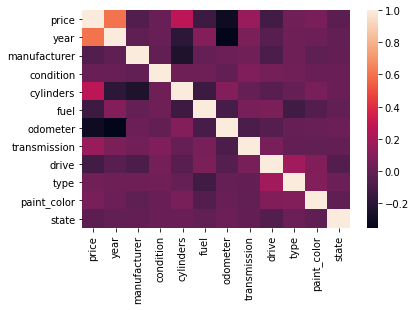

In [ ]:
corr = train0.corr()
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [ ]:
train0.describe()

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
count,72317.000000,72317.000000,72317.000000,72317.000000,72317.00000,72317.000000,72317.000000,72317.000000,72317.000000,72317.000000,72317.000000,72317.000000
mean,12211.615540,110.729414,18.940056,1.111786,4.43644,1.935368,22.404151,0.113556,0.781614,5.914875,5.652364,24.806062
std,8620.378346,4.725801,11.573664,1.164437,1.25688,0.493078,20.733056,0.392055,0.726952,4.230015,3.991016,14.617437
min,123.000000,101.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5900.000000,107.000000,10.000000,0.000000,3.00000,2.000000,13.000000,0.000000,0.000000,0.000000,1.000000,12.000000
50%,9875.000000,111.000000,16.000000,1.000000,5.00000,2.000000,21.000000,0.000000,1.000000,8.000000,8.000000,25.000000
75%,16500.000000,114.000000,31.000000,2.000000,5.00000,2.000000,30.000000,0.000000,1.000000,9.000000,9.000000,37.000000
max,39999.000000,121.000000,41.000000,5.000000,7.00000,4.000000,1880.000000,2.000000,2.000000,12.000000,11.000000,50.000000


In [ ]:
pp.ProfileReport(train0)

Preparing Model

In [ ]:
target_name = 'price'
train_target0 = train0[target_name]
train0 = train0.drop([target_name], axis=1)

In [ ]:
train0, test0, train_target0, test_target0 = train_test_split(train0, train_target0, test_size=0.2, random_state=0)

In [ ]:
#For models from Sklearn
scaler = StandardScaler()
train0 = pd.DataFrame(scaler.fit_transform(train0), columns = train0.columns)

In [ ]:
train0.head(3)

,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,0.268071,-0.425750,-0.952642,0.449594,0.130451,0.029952,-0.288096,-1.075058,-1.396185,1.089828,0.900765
1,-1.002543,-0.425750,0.766020,1.246456,-3.925975,0.277829,-0.288096,-1.075058,0.967292,-1.413103,-0.260602
2,0.479840,-0.512088,0.766020,0.449594,0.130451,-0.366652,-0.288096,0.301067,-1.396185,0.839535,0.627502


In [ ]:
len(train0)

57853

In [ ]:
train, test, target, target_test = train_test_split(train0, train_target0, test_size=0.3, random_state=0)

In [ ]:
train.head(3)

,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
9765,-0.579005,0.696639,1.625351,0.449594,0.130451,0.029952,-0.288096,-1.075058,-1.396185,0.839535,-0.670496
40002,1.115147,-0.166737,-0.952642,0.449594,0.130451,-0.862407,-0.288096,1.677192,0.730944,1.089828,0.149292
54205,-1.214312,-0.512088,0.766020,-1.144129,0.130451,0.525707,-0.288096,-1.075058,1.439988,-1.162810,-0.875443


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40497 entries, 9765 to 2732
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          40497 non-null  float64
 1   manufacturer  40497 non-null  float64
 2   condition     40497 non-null  float64
 3   cylinders     40497 non-null  float64
 4   fuel          40497 non-null  float64
 5   odometer      40497 non-null  float64
 6   transmission  40497 non-null  float64
 7   drive         40497 non-null  float64
 8   type          40497 non-null  float64
 9   paint_color   40497 non-null  float64
 10  state         40497 non-null  float64
dtypes: float64(11)
memory usage: 3.7 MB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17356 entries, 18473 to 39906
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          17356 non-null  float64
 1   manufacturer  17356 non-null  float64
 2   condition     17356 non-null  float64
 3   cylinders     17356 non-null  float64
 4   fuel          17356 non-null  float64
 5   odometer      17356 non-null  float64
 6   transmission  17356 non-null  float64
 7   drive         17356 non-null  float64
 8   type          17356 non-null  float64
 9   paint_color   17356 non-null  float64
 10  state         17356 non-null  float64
dtypes: float64(11)
memory usage: 1.6 MB


Functions to print the accuracy values

In [ ]:
acc_train_r2 = []
acc_test_r2 = []
acc_train_d = []
acc_test_d = []
acc_train_rmse = []
acc_test_rmse = []

In [ ]:
def acc_d(y_meas, y_pred):
    # Relative error between predicted y_pred and measured y_meas values
    return mean_absolute_error(y_meas, y_pred)*len(y_meas)/sum(abs(y_meas))

def acc_rmse(y_meas, y_pred):
    # RMSE between predicted y_pred and measured y_meas values
    return (mean_squared_error(y_meas, y_pred))**0.5

Function calculation of accuracy of model by different metrics 

In [ ]:
def acc_model(num,model,train,test):  
    global acc_train_r2, acc_test_r2, acc_train_d, acc_test_d, acc_train_rmse, acc_test_rmse
    
    ytrain = model.predict(train)  
    ytest = model.predict(test)

    print('target = ', target[:5].values)
    print('ytrain = ', ytrain[:5])

    acc_train_r2_num = round(r2_score(target, ytrain) * 100, 2)
    print('acc(r2_score) for train =', acc_train_r2_num)   
    acc_train_r2.insert(num, acc_train_r2_num)

    acc_train_d_num = round(acc_d(target, ytrain) * 100, 2)
    print('acc(relative error) for train =', acc_train_d_num)   
    acc_train_d.insert(num, acc_train_d_num)

    acc_train_rmse_num = round(acc_rmse(target, ytrain) * 100, 2)
    print('acc(rmse) for train =', acc_train_rmse_num)   
    acc_train_rmse.insert(num, acc_train_rmse_num)

    print('target_test =', target_test[:5].values)
    print('ytest =', ytest[:5])
    
    acc_test_r2_num = round(r2_score(target_test, ytest) * 100, 2)
    print('acc(r2_score) for test =', acc_test_r2_num)
    acc_test_r2.insert(num, acc_test_r2_num)
    
    acc_test_d_num = round(acc_d(target_test, ytest) * 100, 2)
    print('acc(relative error) for test =', acc_test_d_num)
    acc_test_d.insert(num, acc_test_d_num)
    
    acc_test_rmse_num = round(acc_rmse(target_test, ytest) * 100, 2)
    print('acc(rmse) for test =', acc_test_rmse_num)
    acc_test_rmse.insert(num, acc_test_rmse_num)

# Tuning models and test for all features




#1.Linear Regression
Linear Regression is a linear approach to modeling the relationship between a  dependent variable and one or more independent variables. The case of one independent variable is called simple linear regression. For more than one independent variable, the process is called multiple linear regression

In [ ]:
LR = LinearRegression()
LR.fit(train, target)
acc_model(0,LR,train,test)

target =  [ 7997 24931  4400 10900  8500]
ytrain =  [11104.60477598 19479.15296365  1427.27684591 16463.68158361
  7045.63922902]
acc(r2_score) for train = 58.01
acc(relative error) for train = 33.17
acc(rmse) for train = 558140.58
target_test = [21995 13999 19995 13499 10480]
ytest = [17107.0570441  15425.13466848 20630.28527009 16688.57468786
  7687.64987219]
acc(r2_score) for test = 57.78
acc(relative error) for test = 33.45
acc(rmse) for test = 559679.21


#2.Support Vector Machines
Support Vector Machines are supervised learning models with associated learning algorithms that analyze data used for classification and regression analysis. Given a set of training samples, each marked as belonging to one or the other of two categories, an SVM training algorithm builds a model that assigns new test samples to one category or the other, making it a non-probabilistic binary linear classifier

In [ ]:
svr = SVR()
svr.fit(train, target)
acc_model(1,svr,train,test)

target =  [ 7997 24931  4400 10900  8500]
ytrain =  [ 9360.07391239 11025.35080912  8433.20040791 10623.56387365
  8773.05545251]
acc(r2_score) for train = 7.27
acc(relative error) for train = 47.76
acc(rmse) for train = 829408.3
target_test = [21995 13999 19995 13499 10480]
ytest = [10242.08790154 10162.00151222 11400.11952488 10524.68398094
  9655.63286658]
acc(r2_score) for test = 8.08
acc(relative error) for test = 48.06
acc(rmse) for test = 825874.4


#3.Decision Tree Regressor 

This model uses a Decision Tree as a predictive model which maps features (tree branches) to conclusions about the target value (tree leaves). Tree models where the target variable can take a finite set of values are called classification trees.
In these tree structures, leaves represent class labels and branches represent conjunctions of features that lead to those class labels. Decision trees where the target variable can take continuous values (typically real numbers) are called regression trees.

In [ ]:
decision_tree = DecisionTreeRegressor()
decision_tree.fit(train, target)
acc_model(5,decision_tree,train,test)

target =  [ 7997 24931  4400 10900  8500]
ytrain =  [ 7997. 24931.  4400. 10900.  8500.]
acc(r2_score) for train = 99.92
acc(relative error) for train = 0.18
acc(rmse) for train = 24717.73
target_test = [21995 13999 19995 13499 10480]
ytest = [12495. 10495. 19995. 12999. 11500.]
acc(r2_score) for test = 73.31
acc(relative error) for test = 20.62
acc(rmse) for test = 445042.9


#4.Random Forest
Random Forest is one of the most popular model. Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks, that operate by constructing a multitude of decision trees (n_estimators= [100, 300]) at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees.

In [ ]:
random_forest = RandomForestRegressor()
random_forest.fit(train, target)
acc_model(6,random_forest,train,test)

target =  [ 7997 24931  4400 10900  8500]
ytrain =  [ 8147.95 21460.47  4486.8  10841.43  8775.5 ]
acc(r2_score) for train = 97.97
acc(relative error) for train = 6.06
acc(rmse) for train = 122626.01
target_test = [21995 13999 19995 13499 10480]
ytest = [18456.8        13556.         20658.37       14448.21
  9329.64666667]
acc(r2_score) for test = 85.84
acc(relative error) for test = 16.02
acc(rmse) for test = 324128.38


#5.RidgeRegressor 
Tikhonov Regularization, colloquially known as Ridge Regression, is the most commonly used regression algorithm to approximate an answer for an equation with no unique solution. This type of problem is very common in machine learning tasks, where the "best" solution must be chosen using limited data. If a unique solution exists, algorithm will return the optimal value. However, if multiple solutions exist, it may choose any of them.

In [ ]:
from sklearn.linear_model import RidgeCV
ridge = RidgeCV(cv=5)
ridge.fit(train, target)
acc_model(10,ridge,train,test)

target =  [ 7997 24931  4400 10900  8500]
ytrain =  [11104.85384677 19477.14133012  1430.86682953 16462.62404352
  7046.68428672]
acc(r2_score) for train = 58.01
acc(relative error) for train = 33.17
acc(rmse) for train = 558140.61
target_test = [21995 13999 19995 13499 10480]
ytest = [17105.38670188 15424.24780926 20628.67287064 16687.42037191
  7688.19173449]
acc(r2_score) for test = 57.79
acc(relative error) for test = 33.45
acc(rmse) for test = 559676.66


#Models comparison

In [ ]:
models = pd.DataFrame({
    'Model': ['Linear Regression', 'Support Vector Machines', 'Decision Tree Regressor', 'Random Forest', 'RidgeRegressor'],
    'r2_train': acc_train_r2,
    'r2_test': acc_test_r2,
    'd_train': acc_train_d,
    'd_test': acc_test_d,
    'rmse_train': acc_train_rmse,
    'rmse_test': acc_test_rmse
                     })

In [ ]:
print('Prediction accuracy for models by R2 criterion - r2_test')
models.sort_values(by=['r2_test', 'r2_train'], ascending=False)

Prediction accuracy for models by R2 criterion - r2_test


,Model,r2_train,r2_test,d_train,d_test,rmse_train,rmse_test
3,Random Forest,97.97,85.84,6.06,16.02,122626.01,324128.38
2,Decision Tree Regressor,99.92,73.31,0.18,20.62,24717.73,445042.90
4,RidgeRegressor,58.01,57.79,33.17,33.45,558140.61,559676.66
0,Linear Regression,58.01,57.78,33.17,33.45,558140.58,559679.21
1,Support Vector Machines,7.27,8.08,47.76,48.06,829408.30,825874.40


In [ ]:
print('Prediction accuracy for models by RMSE - rmse_test')
models.sort_values(by=['rmse_test', 'rmse_train'], ascending=True)

Prediction accuracy for models by RMSE - rmse_test


,Model,r2_train,r2_test,d_train,d_test,rmse_train,rmse_test
3,Random Forest,97.97,85.84,6.06,16.02,122626.01,324128.38
2,Decision Tree Regressor,99.92,73.31,0.18,20.62,24717.73,445042.90
4,RidgeRegressor,58.01,57.79,33.17,33.45,558140.61,559676.66
0,Linear Regression,58.01,57.78,33.17,33.45,558140.58,559679.21
1,Support Vector Machines,7.27,8.08,47.76,48.06,829408.30,825874.40


# Plots
R2 score comparision between models

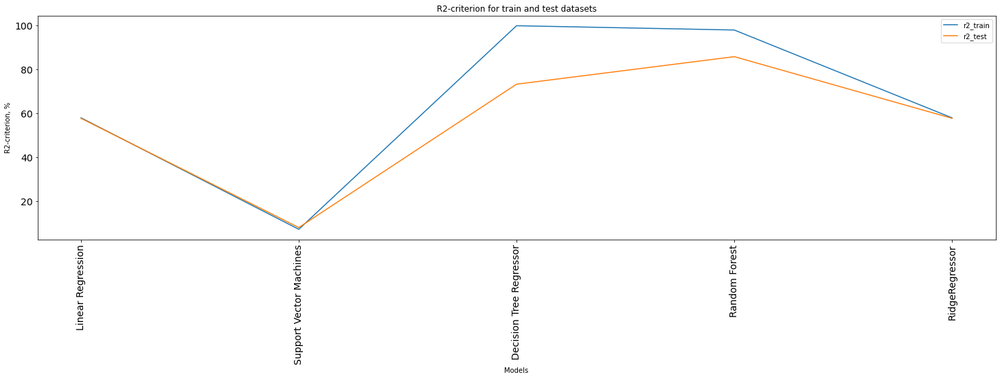

In [ ]:
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['r2_train'], label = 'r2_train')
plt.plot(xx, models['r2_test'], label = 'r2_test')
plt.legend()
plt.title('R2-criterion for train and test datasets')
plt.xlabel('Models')
plt.ylabel('R2-criterion, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()

Relative error comparision between models

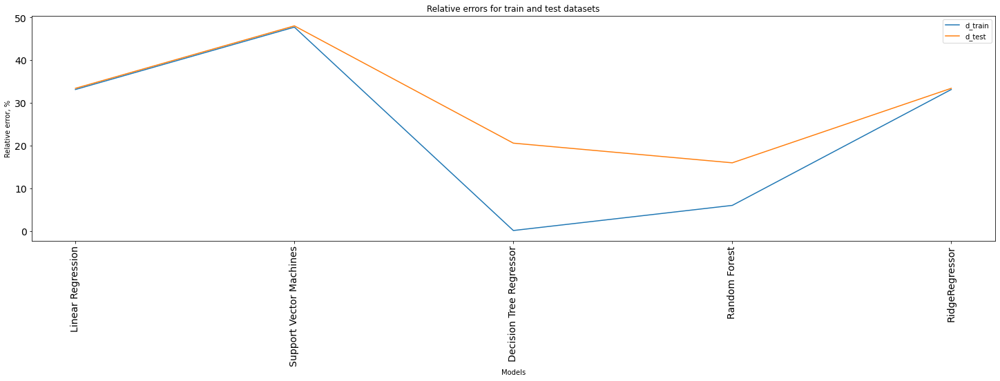

In [ ]:
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['d_train'], label = 'd_train')
plt.plot(xx, models['d_test'], label = 'd_test')
plt.legend()
plt.title('Relative errors for train and test datasets')
plt.xlabel('Models')
plt.ylabel('Relative error, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()

RMSE comparision between models

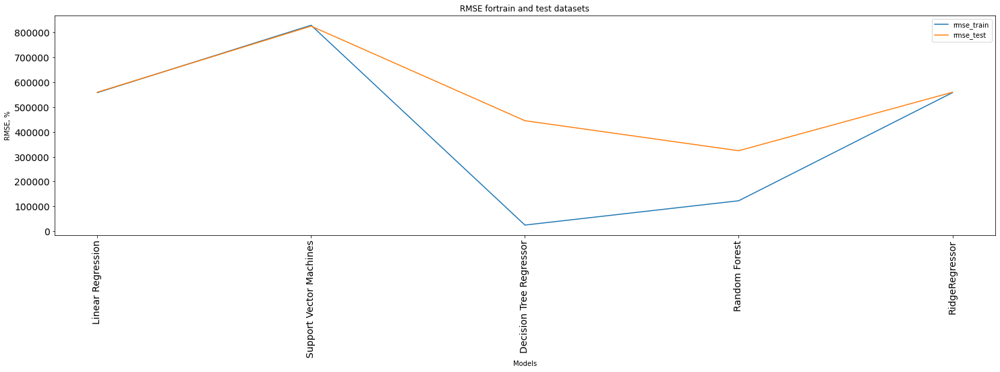

In [ ]:
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['rmse_train'], label = 'rmse_train')
plt.plot(xx, models['rmse_test'], label = 'rmse_test')
plt.legend()
plt.title('RMSE fortrain and test datasets')
plt.xlabel('Models')
plt.ylabel('RMSE, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()